# Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones

Edición 2022

In [ ]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import os

nltk.download("stopwords")
nltk.download("punkt")
nltk.download("wordnet")
nltk.download("omw-1.4")
nltk.download('averaged_perceptron_tagger')
nltk.download('universal_tagset')

from google.colab import drive
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.tag import pos_tag, map_tag

sns.set_context('talk')
sns.set(font_scale=4)

np.set_printoptions(suppress=True)  # no usar notacion "e"

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Unzipping taggers/universal_tagset.zip.


In [ ]:
# Declaramos la ruta principal
google_drive = "/content/gdrive"
root_path = os.path.join(google_drive, "My Drive", "Colab Notebooks", "mentodatos")

# Sincronizamos Google Colaboratory con Google Drive

In [ ]:
drive.mount(google_drive, force_remount = True)

Mounted at /content/gdrive


In [ ]:
# load dataset
df = pd.read_csv(os.path.join(root_path, "datasets", "sentPositiveall-data.csv"), names=["label", "text"], encoding = "ISO-8859-1")

In [ ]:
# dataset dimension
df.shape

(4846, 2)

In [ ]:
# dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4846 entries, 0 to 4845
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   label   4846 non-null   object
 1   text    4846 non-null   object
dtypes: object(2)
memory usage: 75.8+ KB


In [ ]:
df.head(5)

,label,text
0,neutral,"According to Gran , the company has no plans t..."
1,neutral,Technopolis plans to develop in stages an area...
2,negative,The international electronic industry company ...
3,positive,With the new production plant the company woul...
4,positive,According to the company 's updated strategy f...


In [ ]:
df = df[["text", "label"]]
df

,text,label
0,"According to Gran , the company has no plans t...",neutral
1,Technopolis plans to develop in stages an area...,neutral
2,The international electronic industry company ...,negative
3,With the new production plant the company woul...,positive
4,According to the company 's updated strategy f...,positive
...,...,...
4841,LONDON MarketWatch -- Share prices ended lower...,negative
4842,Rinkuskiai 's beer sales fell by 6.5 per cent ...,neutral
4843,Operating profit fell to EUR 35.4 mn from EUR ...,negative
4844,Net sales of the Paper segment decreased to EU...,negative


In [ ]:
# check for missing values
df.isnull().sum()

text     0
label    0
dtype: int64

# Frecuencia de las palabras

In [ ]:
# Importo las librerías necesarias para procesar los textos
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

import re

SPECIAL_CHARACTERS = []

SPECIAL_CHARACTERS.extend(map(chr, range(0, 32)))
SPECIAL_CHARACTERS.extend(map(chr, range(33, 48)))
SPECIAL_CHARACTERS.extend(map(chr, range(58, 65)))
SPECIAL_CHARACTERS.extend(map(chr, range(91, 97)))
SPECIAL_CHARACTERS.extend(map(chr, range(123, 225)))
SPECIAL_CHARACTERS.extend(map(chr, range(226, 233)))
SPECIAL_CHARACTERS.extend(map(chr, range(234, 237)))
SPECIAL_CHARACTERS.extend(map(chr, range(238, 241)))
SPECIAL_CHARACTERS.extend(map(chr, range(242, 243)))
SPECIAL_CHARACTERS.extend(map(chr, range(244, 250)))
SPECIAL_CHARACTERS.extend(map(chr, range(251, 880)))

In [ ]:
class CleanText():
    
    def __init__(self, text, language="english"):
        
        self.text = text
        
        self.language = language
        
        self.clean_text = None
        
        self.remove_spec_text = None
        
        self.remove_stop_text = None
        
        self.lemma_text = None
    
    def removePatterns(self):
        
        replacements = (
            ("á", "a"),
            ("é", "e"),
            ("í", "i"),
            ("ó", "o"),
            ("ú", "u"),
        )
        
        self.text = str(self.text)
        
        self.clean_text = self.text.lower()
        
        self.clean_text = re.sub(r"\s{2,}", " ", self.clean_text)
        
        self.clean_text = re.sub(r"\n", " ", self.clean_text)
        
        self.clean_text = re.sub(r"\d+", " ", self.clean_text)
        
        self.clean_text = re.sub(r"^\s+", " ", self.clean_text)
        
        self.clean_text = re.sub(r"\s+", " ", self.clean_text)
        
        for a, b in replacements:
            
            self.clean_text = self.clean_text.replace(a, b).replace(a.upper(), b.upper())
        
        return self.clean_text
    
    def removeSpecChars(self):
        
        remove_patterns = self.removePatterns()
        
        tokens = list(word_tokenize(remove_patterns))
        
        clean_tokens = tokens.copy()
        
        for i in range(len(clean_tokens)):
            
            for special_character in SPECIAL_CHARACTERS:
            
                clean_tokens[i] = clean_tokens[i].replace(special_character, '')            
            
        clean_tokens = [token for token in clean_tokens if token]        
        
        self.remove_spec_text = " ".join(clean_tokens)        
        
        return self.remove_spec_text       
    
    def RemoveStopText(self):
        
        st = ["'", "!", '"', "#", "$", "%", "&", "*", "+", "-", ".", "/", "<", "=", '>', "?",
          "@", "[", "\\", "]", "^", "_", '`', "{", "|", "}", '~']
        
        sw = stopwords.words(self.language) + st
        
        text = list(word_tokenize(self.removeSpecChars()))
        
        text = [w for w in text if not w in sw]
        
        self.remove_stop_text = " ".join(text)
        
        return self.remove_stop_text
    
    def lemmatizeText(self):
        
        lemmatizer = WordNetLemmatizer()
        
        list_lemma_text = []
        
        tokens = word_tokenize(self.RemoveStopText())
        
        for token in tokens:
            
            lemmetized_word = lemmatizer.lemmatize(token)
            
            list_lemma_text.append(lemmetized_word)
        
        self.lemma_text = " ".join(list_lemma_text)
        
        return self.lemma_text

In [ ]:
new_df = df.copy()

In [ ]:
new_df["clean_text"] = new_df["text"].map(lambda x: CleanText(str(x)).lemmatizeText())

In [ ]:
new_df

,text,label,clean_text
0,"According to Gran , the company has no plans t...",neutral,according gran company plan move production ru...
1,Technopolis plans to develop in stages an area...,neutral,technopolis plan develop stage area le square ...
2,The international electronic industry company ...,negative,international electronic industry company elco...
3,With the new production plant the company woul...,positive,new production plant company would increase ca...
4,According to the company 's updated strategy f...,positive,according company updated strategy year baswar...
...,...,...,...
4841,LONDON MarketWatch -- Share prices ended lower...,negative,london marketwatch share price ended lower lon...
4842,Rinkuskiai 's beer sales fell by 6.5 per cent ...,neutral,rinkuskiai beer sale fell per cent million lit...
4843,Operating profit fell to EUR 35.4 mn from EUR ...,negative,operating profit fell eur mn eur mn including ...
4844,Net sales of the Paper segment decreased to EU...,negative,net sale paper segment decreased eur mn second...


In [ ]:
new_df["target"] = new_df.apply(lambda x: -1 if str(x["label"]) == "negative" else (0 if str(x["label"]) == "neutral" else 1), axis=1)

In [ ]:
new_df

,text,label,clean_text,target
0,"According to Gran , the company has no plans t...",neutral,according gran company plan move production ru...,0
1,Technopolis plans to develop in stages an area...,neutral,technopolis plan develop stage area le square ...,0
2,The international electronic industry company ...,negative,international electronic industry company elco...,-1
3,With the new production plant the company woul...,positive,new production plant company would increase ca...,1
4,According to the company 's updated strategy f...,positive,according company updated strategy year baswar...,1
...,...,...,...,...
4841,LONDON MarketWatch -- Share prices ended lower...,negative,london marketwatch share price ended lower lon...,-1
4842,Rinkuskiai 's beer sales fell by 6.5 per cent ...,neutral,rinkuskiai beer sale fell per cent million lit...,0
4843,Operating profit fell to EUR 35.4 mn from EUR ...,negative,operating profit fell eur mn eur mn including ...,-1
4844,Net sales of the Paper segment decreased to EU...,negative,net sale paper segment decreased eur mn second...,-1


In [ ]:
# new_df.to_csv(os.path.join(os.getcwd(), "sentPositiveall-cleandata.csv"), encoding="utf-8", index=False)

# Palabras más frecuentes

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
cv = CountVectorizer()
sum_words_without_clean = cv.fit_transform(new_df['text'].values.astype('U')).sum(axis=0)

# Calculamos 
words_freq_without_clean = [(word, sum_words_without_clean[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq_without_clean = sorted(words_freq_without_clean, key = lambda x: x[1], reverse=True)[:25]

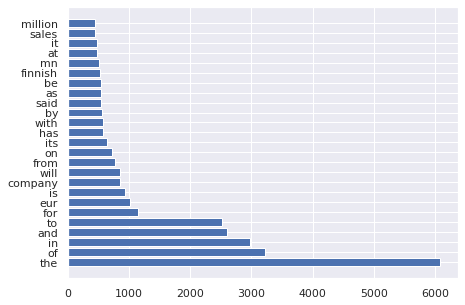

In [ ]:
sns.set(font_scale=1)

plt.figure(figsize=(7, 5))
plt.barh(*zip(*words_freq_without_clean))

plt.show()

# Palabras más frecuentes del texto limpio

In [ ]:
sum_words_with_clean = cv.fit_transform(new_df['clean_text'].values.astype('U')).sum(axis=0)

# Calculamos 
words_freq_with_clean = [(word, sum_words_with_clean[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq_with_clean = sorted(words_freq_with_clean, key = lambda x: x[1], reverse=True)[:25]

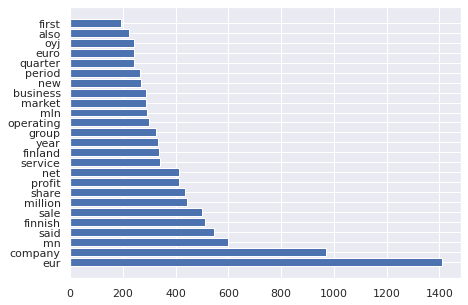

In [ ]:
sns.set(font_scale=1)

plt.figure(figsize=(7, 5))
plt.barh(*zip(*words_freq_with_clean))

plt.show()

# Nube de Palabras

Se separan las palabras según etiqueta (negative, neutral, positive)

Negative Class

In [ ]:
stopwords = set(STOPWORDS)

negative_df = new_df[new_df["target"] == -1]

negative_text = " ".join(review for review in negative_df.clean_text.astype(str))

wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(negative_text)

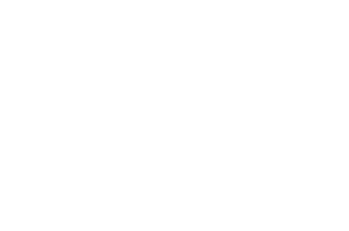

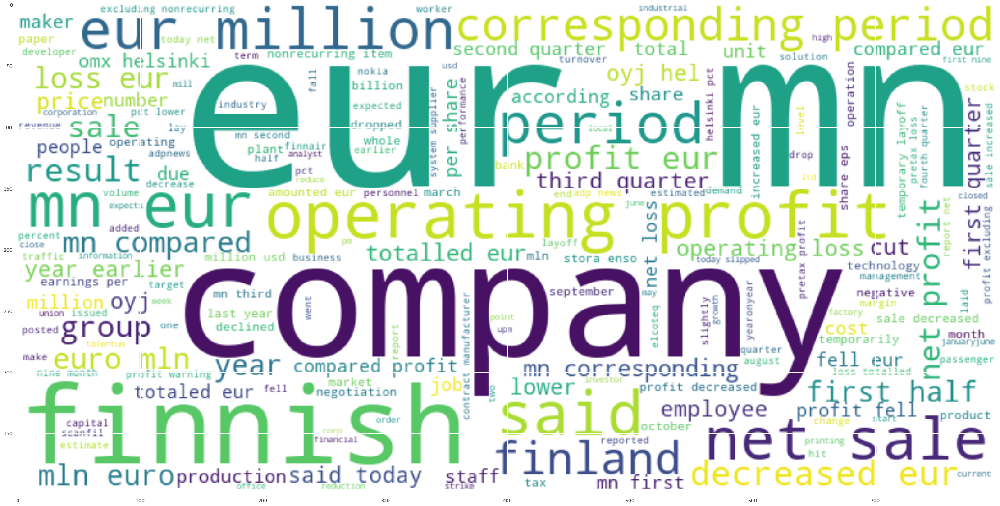

In [ ]:
plt.axis("off")

plt.figure(figsize=(40,20))

plt.tight_layout(pad=0)

plt.imshow(wordcloud, interpolation="bilinear")

plt.show()

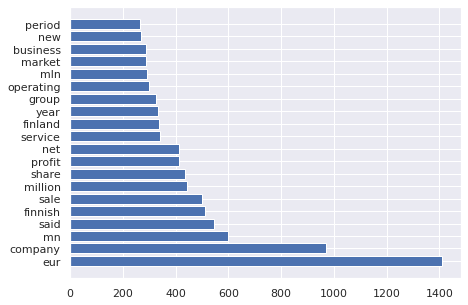

In [ ]:
sum_words_neg = cv.fit_transform(new_df['clean_text'].values.astype('U')).sum(axis=0)

# Calculamos 
words_freq_neg = [(word, sum_words_neg[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq_neg = sorted(words_freq_neg, key = lambda x: x[1], reverse=True)[:20]


sns.set(font_scale=1)

plt.figure(figsize=(7, 5))
plt.barh(*zip(*words_freq_neg))

plt.show()

# Nube de Palabras - Neutro

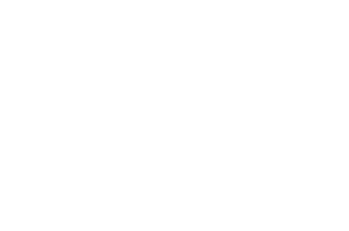

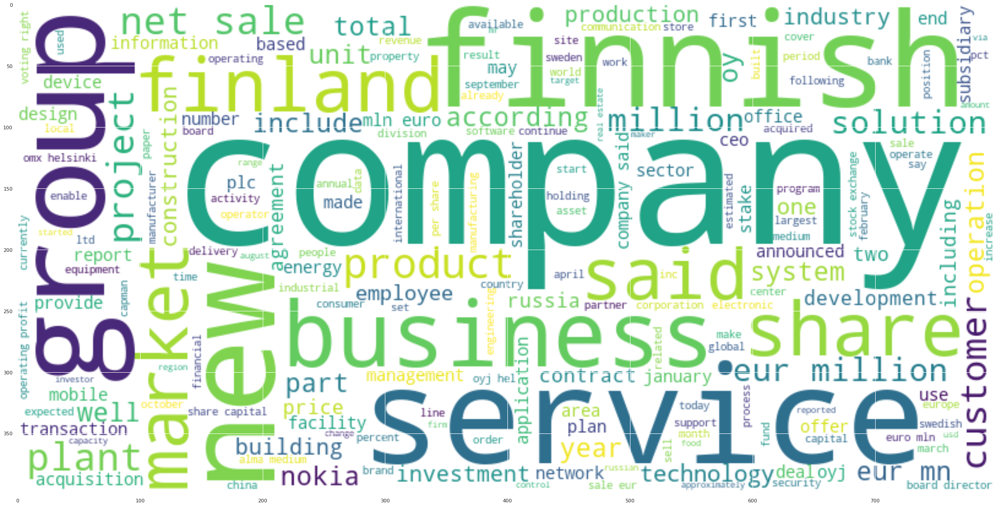

In [ ]:
neutral_df = new_df[new_df["target"] == 0]

neutral_text = " ".join(review for review in neutral_df.clean_text.astype(str))

wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(neutral_text)

plt.axis("off")

plt.figure(figsize=(40,20))

plt.tight_layout(pad=0)

plt.imshow(wordcloud, interpolation="bilinear")

plt.show()

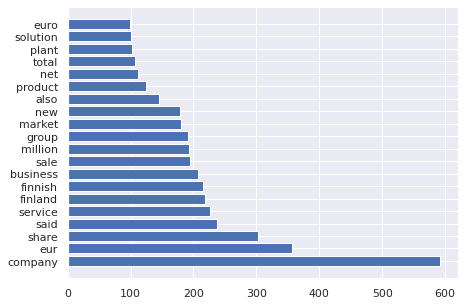

In [ ]:
sum_words_neu = cv.fit_transform(neutral_df['clean_text'].values.astype('U')).sum(axis=0)

# Calculamos 
words_freq_neu = [(word, sum_words_neu[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq_neu = sorted(words_freq_neu, key = lambda x: x[1], reverse=True)[:20]


sns.set(font_scale=1)

plt.figure(figsize=(7, 5))
plt.barh(*zip(*words_freq_neu))

plt.show()

# Nube de Palabras - Positive

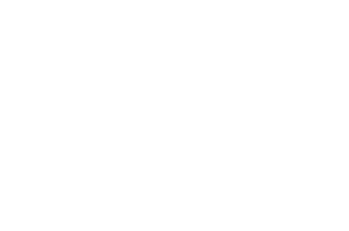

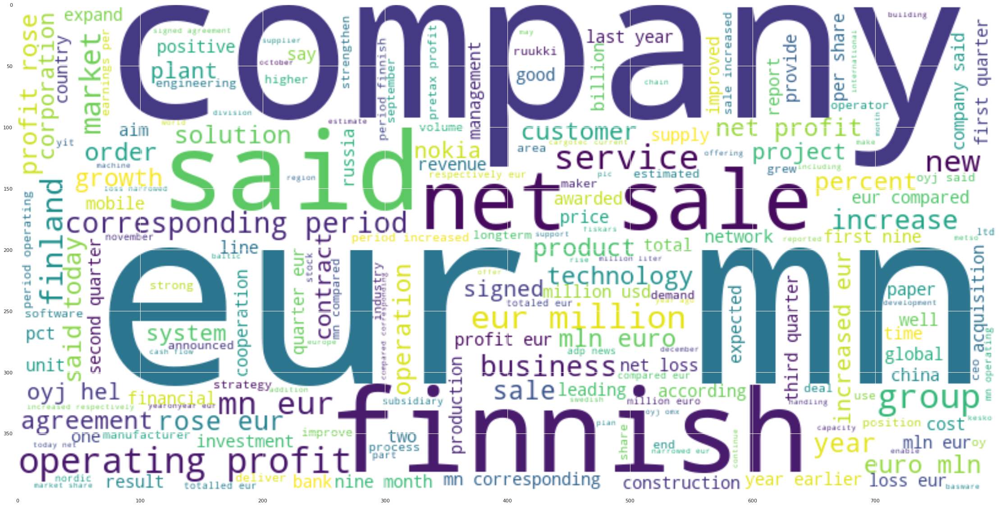

In [ ]:
positive_df = new_df[new_df["target"] == 1]

positive_text = " ".join(review for review in positive_df.clean_text.astype(str))

wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(positive_text)

plt.axis("off")

plt.figure(figsize=(40,20))

plt.tight_layout(pad=0)

plt.imshow(wordcloud, interpolation="bilinear")

plt.show()

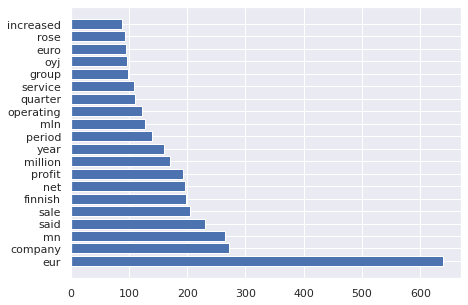

In [ ]:
sum_words_pos = cv.fit_transform(positive_df['clean_text'].values.astype('U')).sum(axis=0)

# Calculamos 
words_freq_pos = [(word, sum_words_pos[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq_pos = sorted(words_freq_pos, key = lambda x: x[1], reverse=True)[:20]


sns.set(font_scale=1)

plt.figure(figsize=(7, 5))
plt.barh(*zip(*words_freq_pos))

plt.show()

# Frecuencia y Nube de Palabras aplicando POS-TAG Classification

In [ ]:
def adjverb_column(text):

  listOfPartsOfSpeechWithWords = []

  text = text.lower()

  text = word_tokenize(text)

  posTagged = pos_tag(text)

  simplifiedTags = [(word, map_tag('en-ptb', 'universal', tag)) for word, tag in posTagged]

  adjetives_list = []

  for s in simplifiedTags:

    if s[1] == "ADJ" or s[1] == "VERB":

      adjetives_list.append(s[0])
  
  text = " ".join(t for t in adjetives_list)

  return text



In [ ]:
adj_df = new_df.copy()

In [ ]:
adj_df["adj_text"] = new_df["clean_text"].map(lambda x: adjverb_column(str(x)))

In [ ]:
adj_df

,text,label,clean_text,target,adj_text
0,"According to Gran , the company has no plans t...",neutral,according gran company plan move production ru...,0,according move growing
1,Technopolis plans to develop in stages an area...,neutral,technopolis plan develop stage area le square ...,0,develop stage working said
2,The international electronic industry company ...,negative,international electronic industry company elco...,-1,international electronic laid ten contrary ear...
3,With the new production plant the company woul...,positive,new production plant company would increase ca...,1,new would increase expected increase would imp...
4,According to the company 's updated strategy f...,positive,according company updated strategy year baswar...,1,according updated longterm net net
...,...,...,...,...,...
4841,LONDON MarketWatch -- Share prices ended lower...,negative,london marketwatch share price ended lower lon...,-1,ended lower rebound failed offset broader
4842,Rinkuskiai 's beer sales fell by 6.5 per cent ...,neutral,rinkuskiai beer sale fell per cent million lit...,0,fell jumped
4843,Operating profit fell to EUR 35.4 mn from EUR ...,negative,operating profit fell eur mn eur mn including ...,-1,fell mn including vessel
4844,Net sales of the Paper segment decreased to EU...,negative,net sale paper segment decreased eur mn second...,-1,net decreased eur mn second second operating e...


# Nube de Palabras - Negative - AdjVerb

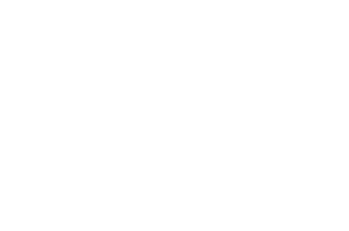

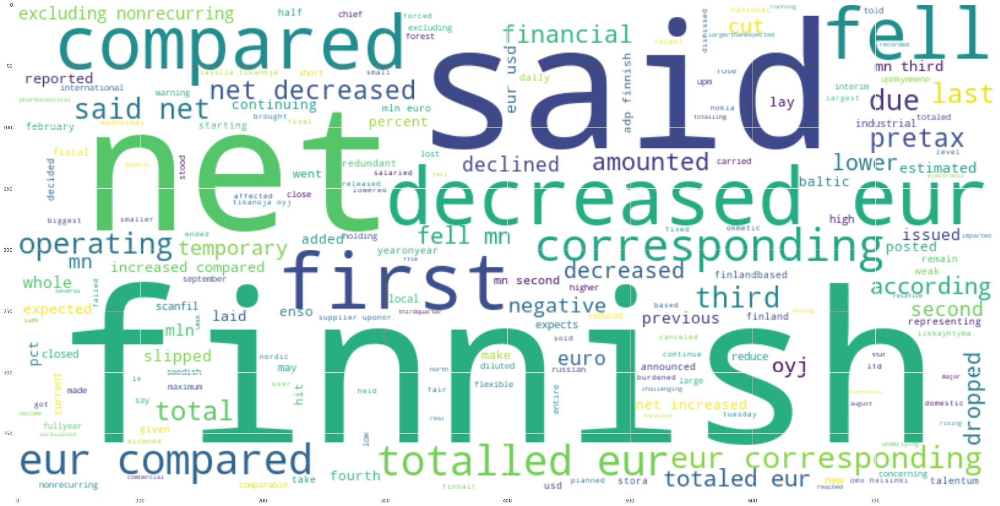

In [ ]:
adj_negative_df = adj_df[adj_df["target"] == -1]

adj_negative_text = " ".join(review for review in adj_negative_df.adj_text.astype(str))

wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(adj_negative_text)

plt.axis("off")

plt.figure(figsize=(40,20))

plt.tight_layout(pad=0)

plt.imshow(wordcloud, interpolation="bilinear")

plt.show()

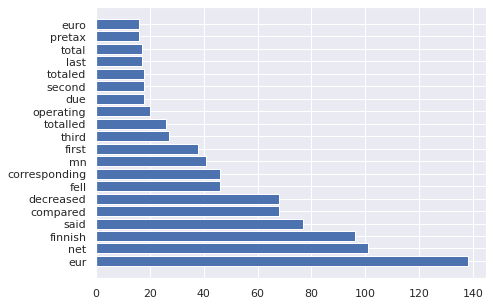

In [ ]:
sum_words_adj_neg = cv.fit_transform(adj_negative_df["adj_text"].values.astype("U")).sum(axis=0)

# Calculamos 
words_freq_adj_neg = [(word, sum_words_adj_neg[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq_adj_neg = sorted(words_freq_adj_neg, key = lambda x: x[1], reverse=True)[:20]


sns.set(font_scale=1)

plt.figure(figsize=(7, 5))
plt.barh(*zip(*words_freq_adj_neg))

plt.show()

# Nube de Palabras - Neutral - AdjVerb

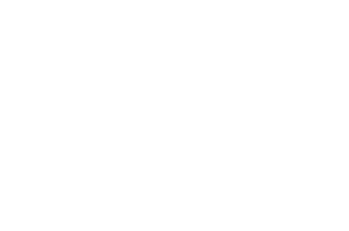

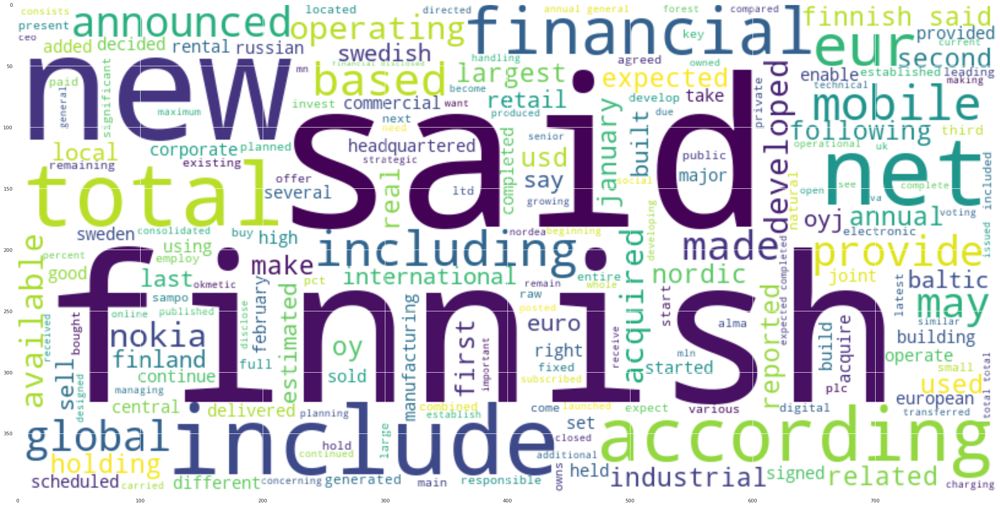

In [ ]:
adj_neutral_df = adj_df[adj_df["target"] == 0]

adj_neutral_text = " ".join(review for review in adj_neutral_df.adj_text.astype(str))

wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(adj_neutral_text)

plt.axis("off")

plt.figure(figsize=(40,20))

plt.tight_layout(pad=0)

plt.imshow(wordcloud, interpolation="bilinear")

plt.show()

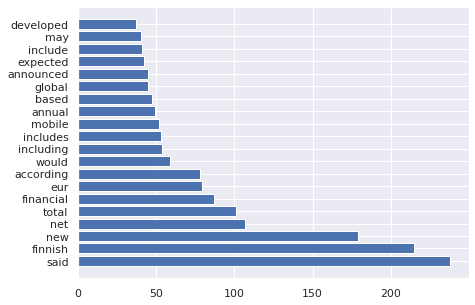

In [ ]:
sum_words_adj_neu = cv.fit_transform(adj_neutral_df["adj_text"].values.astype("U")).sum(axis=0)

# Calculamos 
words_freq_adj_neu = [(word, sum_words_adj_neu[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq_adj_neu = sorted(words_freq_adj_neu, key = lambda x: x[1], reverse=True)[:20]


sns.set(font_scale=1)

plt.figure(figsize=(7, 5))
plt.barh(*zip(*words_freq_adj_neu))

plt.show()

# Nube de Palabras - Positive - AdjVerb

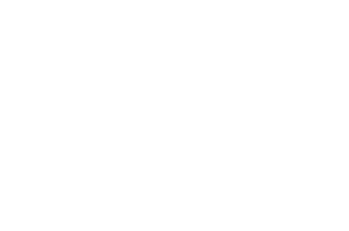

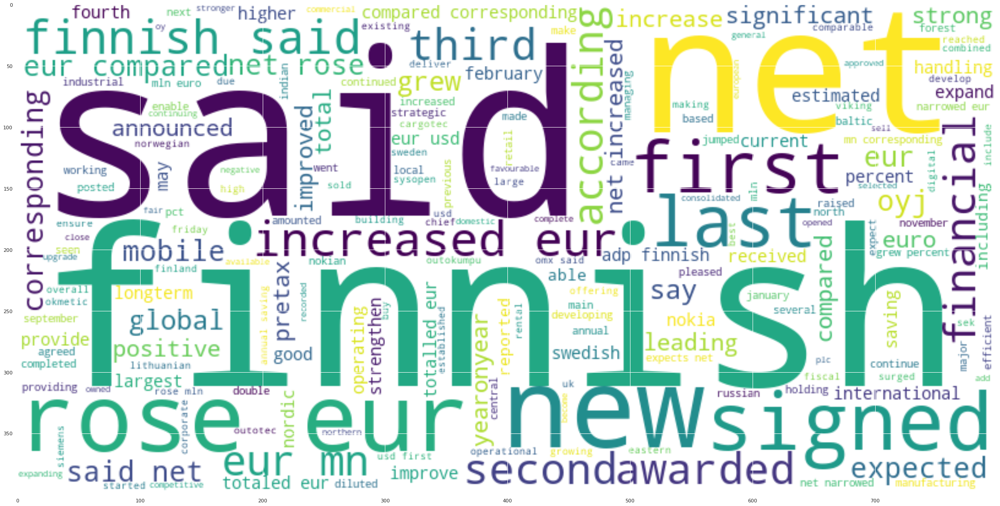

In [ ]:
adj_positive_df = adj_df[adj_df["target"] == 1]

adj_positive_text = " ".join(review for review in adj_positive_df.adj_text.astype(str))

wordcloud = WordCloud(stopwords=stopwords, background_color="white", width=800, height=400).generate(adj_positive_text)

plt.axis("off")

plt.figure(figsize=(40,20))

plt.tight_layout(pad=0)

plt.imshow(wordcloud, interpolation="bilinear")

plt.show()

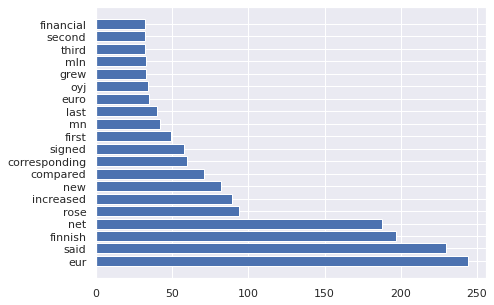

In [ ]:
sum_words_adj_pos = cv.fit_transform(adj_positive_df["adj_text"].values.astype("U")).sum(axis=0)

# Calculamos 
words_freq_adj_pos = [(word, sum_words_adj_pos[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq_adj_pos = sorted(words_freq_adj_pos, key = lambda x: x[1], reverse=True)[:20]


sns.set(font_scale=1)

plt.figure(figsize=(7, 5))
plt.barh(*zip(*words_freq_adj_pos))

plt.show()

In [ ]:
list_adj_neg = [x[0] for x in words_freq_adj_neg]
list_adj_neu = [y[0] for y in words_freq_adj_neu]
list_adj_pos = [z[0] for z in words_freq_adj_pos]

In [ ]:
unique_adj_neg = [x for x in list_adj_neg if x not in list_adj_neu and x not in list_adj_pos]
unique_adj_neu = [x for x in list_adj_neu if x not in list_adj_neg and x not in list_adj_pos]
unique_adj_pos = [x for x in list_adj_pos if x not in list_adj_neu and x not in list_adj_neg]

In [ ]:
print(unique_adj_neg)
print(unique_adj_neu)
print(unique_adj_pos)

['decreased', 'fell', 'totalled', 'operating', 'due', 'totaled', 'pretax']
['according', 'would', 'including', 'includes', 'mobile', 'annual', 'based', 'global', 'announced', 'expected', 'include', 'may', 'developed']
['rose', 'increased', 'signed', 'oyj', 'grew', 'mln']


# Conclusión

En este análisis preliminar, correspondiente a la primer entrega, se observa que existen ciertas palabras que describen de una u otra manera si el sentimiento es positivo, negativo o neutro. La táctica de utilizar Parts of Speech (POS TAGS) en esta etapa nos permite visualizar que estrategia utilizar en la etapa de clasificación.

In [ ]:
adj_positive_df.to_csv(os.path.join(root_path, "datasets", "sentPositiveall-cleandataVF.csv"), encoding="ISO-8859-1", index=False)

In [ ]:
adj_df = adj_df.reindex(columns=["adj_text", "target"])

In [ ]:
adj_df

,adj_text,target
0,according move growing,0
1,develop stage working said,0
2,international electronic laid ten contrary ear...,-1
3,new would increase expected increase would imp...,1
4,according updated longterm net net,1
...,...,...
4841,ended lower rebound failed offset broader,-1
4842,fell jumped,0
4843,fell mn including vessel,-1
4844,net decreased eur mn second second operating e...,-1


In [ ]:
adj_df_without_neutral = adj_df.copy()

adj_df_without_neutral = adj_df_without_neutral[adj_df_without_neutral["target"] != 0]

In [ ]:
adj_df_without_neutral = adj_df_without_neutral.reset_index(drop=True)

In [ ]:
adj_df_without_neutral

,adj_text,target
0,international electronic laid ten contrary ear...,-1
1,new would increase expected increase would imp...,1
2,according updated longterm net net,1
3,financing aspocomp aspocomp pursuing focusing ...,1
4,last componenta net doubled eur moved pretax p...,1
...,...,...
1962,financial fell early handling posted drop over...,-1
1963,ended lower rebound failed offset broader,-1
1964,fell mn including vessel,-1
1965,net decreased eur mn second second operating e...,-1


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

vectorizer = TfidfVectorizer(max_features=50000)

X = adj_df.adj_text
y = adj_df.target

# División entre entrenamiento y test usando la funcion de sklearn
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

vectorizer.fit_transform(X_train)

<3876x3637 sparse matrix of type '<class 'numpy.float64'>'
	with 15349 stored elements in Compressed Sparse Row format>

In [ ]:
import pickle
from sklearn.base import BaseEstimator
from scipy.sparse import issparse
 
# http://rasbt.github.io/mlxtend/
class DenseTransformer(BaseEstimator):

    def __init__(self, return_copy=True):
        self.return_copy = return_copy
        self.is_fitted = False
 
    def transform(self, X, y=None):
        if issparse(X):
            return X.toarray()
        elif self.return_copy:
            return X.copy()
        else:
            return X
 
    def fit(self, X, y=None):

        self.is_fitted = True

        return self
    
    def fit_transform(self, X, y=None):

        return self.transform(X=X, y=y)

In [ ]:
# pipeline_gaussiano = pickle.load(open("naive_noticias_model.pickle", "rb"))

In [ ]:
# Importamos el clasificador naive bayes, este tiene tres distribuciones Gausiano, Bernoulli, Multinomial
from sklearn.naive_bayes import GaussianNB
# Un pipeline es un conjunto de tuberias o flujos que parten de una entrada (datos) 
# hacia una salida (modelo)
from sklearn.pipeline import make_pipeline
pipeline_gaussiano = make_pipeline(
    vectorizer,
    DenseTransformer(),
    GaussianNB()
)

pipeline_gaussiano.fit(X=X_train, y=y_train)

import pickle
pickle.dump(pipeline_gaussiano, open("naive_noticias_model.pickle", "wb"))
print ("Modelo Creado")

Modelo Creado


In [ ]:
y_pred = pipeline_gaussiano.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

confusion_m = confusion_matrix(y_test, y_pred)

In [ ]:
confusion_m

array([[ 86,  17,  25],
       [147, 221, 207],
       [ 85,  54, 128]])

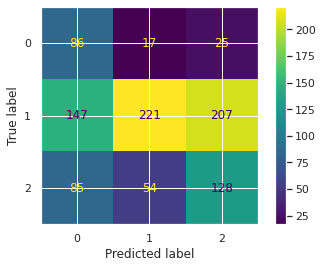

In [ ]:
display = ConfusionMatrixDisplay(confusion_matrix=confusion_m)
display.plot()

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          -1       0.27      0.67      0.39       128
           0       0.76      0.38      0.51       575
           1       0.36      0.48      0.41       267

    accuracy                           0.45       970
   macro avg       0.46      0.51      0.43       970
weighted avg       0.58      0.45      0.47       970



In [ ]:
X = adj_df_without_neutral.adj_text
y = adj_df_without_neutral.target

# División entre entrenamiento y test usando la funcion de sklearn
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

vectorizer.fit_transform(X_train)

<1573x1912 sparse matrix of type '<class 'numpy.float64'>'
	with 6839 stored elements in Compressed Sparse Row format>

In [ ]:
pipeline_gaussiano.fit(X=X_train, y=y_train)

import pickle
pickle.dump(pipeline_gaussiano, open("naive_sentiment_model.pickle", "wb"))
print ("Modelo Creado")

Modelo Creado


In [ ]:
y_pred_2 = pipeline_gaussiano.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

          -1       0.44      0.82      0.57       116
           1       0.88      0.56      0.69       278

    accuracy                           0.64       394
   macro avg       0.66      0.69      0.63       394
weighted avg       0.75      0.64      0.65       394

